# **Time Series Anomaly Detection with LSTM Autoencoders using Keras in Python**:
 **LSTM Autoencoders**:
          
**Autoencoders Neural Networks** try to learn data representation of its input. So the input of the Autoencoder is the same as the output? Not quite. Usually, we want to learn an efficient encoding that uses fewer parameters/memory.

The encoding should allow for output similar to the original input. In a sense, we’re forcing the model to learn the most important features of the data using as few parameters as possible.
       
   **Anomaly Detection with Autoencoders**:
    
  **Here are the basic steps to Anomaly Detection using an Autoencoder:**

1)Train an Autoencoder on normal data (no anomalies).

2)Take a new data point and try to reconstruct it using the Autoencoder.

3)If the error (reconstruction error) for the new data point is above some threshold, we label the example as an anomaly.

Good, but is this useful for Time Series Data? Yes, we need to take into account the temporal properties of the data. Luckily, LSTMs can help us with that.

**About Dataset**: 

Dataset I have used for this kernel is un-labelled data and reason for using this dataset is that I have to compare the result of algorithms. there are some missing values in the dataset i have filled those missing values with interpolation method.The the data is unlabelled i have done Anomaly calculation by assumtion and also it as 1 million instances.

In [ ]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [ ]:
!pip install gdown
!pip install tensorflow-gpu

     |████████████████████████████████| 320.4MB 50kB/s 


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from pandas.plotting import register_matplotlib_converters

%matplotlib inline
%config InlineBackend.figure_format='retina'

register_matplotlib_converters()
sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 22, 10

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 2016.csv to 2016.csv


In [ ]:
for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

User uploaded file "2016.csv" with length 14345177 bytes


In [ ]:
uploaded

{'2016.csv': b'FL_DATE,CRS_ELAPSED_TIME\r\n01-01-16,309\r\n01-01-16,116\r\n01-01-16,245\r\n01-01-16,213\r\n01-01-16,136\r\n01-01-16,66\r\n01-01-16,70\r\n01-01-16,65\r\n01-01-16,77\r\n01-01-16,146\r\n01-01-16,234\r\n01-01-16,320\r\n01-01-16,112\r\n01-01-16,132\r\n01-01-16,262\r\n01-01-16,75\r\n01-01-16,148\r\n01-01-16,212\r\n01-01-16,72\r\n01-01-16,73\r\n01-01-16,67\r\n01-01-16,137\r\n01-01-16,169\r\n01-01-16,99\r\n01-01-16,245\r\n01-01-16,119\r\n01-01-16,155\r\n01-01-16,83\r\n01-01-16,86\r\n01-01-16,186\r\n01-01-16,95\r\n01-01-16,104\r\n01-01-16,128\r\n01-01-16,376\r\n01-01-16,179\r\n01-01-16,184\r\n01-01-16,110\r\n01-01-16,282\r\n01-01-16,288\r\n01-01-16,100\r\n01-01-16,84\r\n01-01-16,110\r\n01-01-16,158\r\n01-01-16,90\r\n01-01-16,100\r\n01-01-16,240\r\n01-01-16,346\r\n01-01-16,205\r\n01-01-16,76\r\n01-01-16,88\r\n01-01-16,130\r\n01-01-16,188\r\n01-01-16,77\r\n01-01-16,100\r\n01-01-16,89\r\n01-01-16,114\r\n01-01-16,227\r\n01-01-16,87\r\n01-01-16,267\r\n01-01-16,84\r\n01-01-16,81\r\n01

# **Exploratory data analysis**:

In [ ]:
import pandas as pd
import io
df = pd.read_csv(io.StringIO(uploaded['2016.csv'].decode('utf-8')),parse_dates=['FL_DATE'], index_col='FL_DATE')
#df = df.sample(frac=0.35,replace=False)
print(df)

            CRS_ELAPSED_TIME
FL_DATE                     
2016-01-01               309
2016-01-01               116
2016-01-01               245
2016-01-01               213
2016-01-01               136
...                      ...
2016-12-03               245
2016-12-03               275
2016-12-03               275
2016-12-03               170
2016-12-03               152

[1048575 rows x 1 columns]


In [ ]:
df.isna().sum()

CRS_ELAPSED_TIME    0
dtype: int64

In [ ]:
#Null value Imputation using Interpolation Method
df['CRS_ELAPSED_TIME']=df['CRS_ELAPSED_TIME'].interpolate(method='linear',limit_direction ='both',axis=0) #Interploation
df.isna().sum()

CRS_ELAPSED_TIME    0
dtype: int64

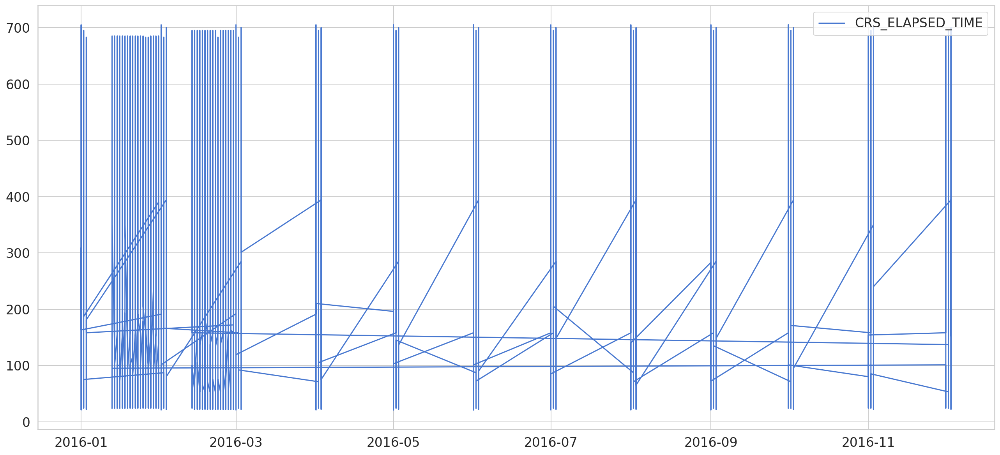

In [ ]:
plt.plot(df, label='CRS_ELAPSED_TIME')
plt.legend();

# **Preprocessing**:
We’ll use 95% of the data and train our model on it:

In [ ]:
train_size = int(len(df) * 0.95)
test_size = len(df) - train_size
train, test = df.iloc[0:train_size], df.iloc[train_size:len(df)]
print(train.shape, test.shape)

(996146, 1) (52429, 1)


*Next, we’ll rescale the data using the training data and apply the same transformation to the test data:*

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler = scaler.fit(train[['CRS_ELAPSED_TIME']])

train['CRS_ELAPSED_TIME'] = scaler.transform(train[['CRS_ELAPSED_TIME']])
test['CRS_ELAPSED_TIME'] = scaler.transform(test[['CRS_ELAPSED_TIME']])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [ ]:
train.head()

,CRS_ELAPSED_TIME
FL_DATE,
2016-01-01,2.127284
2016-01-01,-0.396557
2016-01-01,1.290363
2016-01-01,0.871902
2016-01-01,-0.135019


*Finally, we’ll split the data into subsequences. Here’s the little helper function for that*:

In [ ]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps)].values
        Xs.append(v)        
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

*We’ll create sequences with 30 days worth of historical data:*

In [ ]:
TIME_STEPS = 3

# reshape to [samples, time_steps, n_features]

X_train, y_train = create_dataset(train[['CRS_ELAPSED_TIME']], train.CRS_ELAPSED_TIME, TIME_STEPS)
X_test, y_test = create_dataset(test[['CRS_ELAPSED_TIME']], test.CRS_ELAPSED_TIME, TIME_STEPS)

print(X_train.shape)

(996143, 3, 1)


In [ ]:
X_train.shape

(996143, 3, 1)

# **LSTM Autoencoder in Keras**:
*Our Autoencoder should take a sequence as input and outputs a sequence of the same shape. Here’s how to build such a simple model in Keras:*

In [ ]:
#LSTM AUTOENCODER
model = keras.Sequential()
model.add(keras.layers.LSTM(
    units=64, 
    input_shape=(X_train.shape[1], X_train.shape[2])
))
model.add(keras.layers.Dropout(rate=0.2))
model.add(keras.layers.RepeatVector(n=X_train.shape[1]))
model.add(keras.layers.LSTM(units=64, return_sequences=True))
model.add(keras.layers.Dropout(rate=0.2))
model.add(keras.layers.TimeDistributed(keras.layers.Dense(units=X_train.shape[2])))
model.compile(loss='mae', optimizer='adam')

*There are a couple of things that might be new to you in this model. The RepeatVector layer simply repeats the input n times. Adding return_sequences=True in LSTM layer makes it return the sequence.*

*Finally, the TimeDistributed layer creates a vector with a length of the number of outputs from the previous layer. Your first LSTM Autoencoder is ready for training.*

**Training the model is no different from a regular LSTM model:**

In [ ]:
history = model.fit(
    X_train, y_train,
    epochs=10,
    batch_size=32,
    validation_split=0.1,
    shuffle=False
)

Epoch 1/10
28017/28017 [==============================] - 155s 6ms/step - loss: 0.5975 - val_loss: 0.5928
Epoch 2/10
28017/28017 [==============================] - 162s 6ms/step - loss: 0.5916 - val_loss: 0.5865
Epoch 3/10
28017/28017 [==============================] - 159s 6ms/step - loss: 0.5901 - val_loss: 0.5832
Epoch 4/10
28017/28017 [==============================] - 158s 6ms/step - loss: 0.5889 - val_loss: 0.5812
Epoch 5/10
28017/28017 [==============================] - 161s 6ms/step - loss: 0.5878 - val_loss: 0.5799
Epoch 6/10
28017/28017 [==============================] - 162s 6ms/step - loss: 0.5866 - val_loss: 0.5801
Epoch 7/10
28017/28017 [==============================] - 164s 6ms/step - loss: 0.5851 - val_loss: 0.5773
Epoch 8/10
28017/28017 [==============================] - 166s 6ms/step - loss: 0.5834 - val_loss: 0.5759
Epoch 9/10
28017/28017 [==============================] - 166s 6ms/step - loss: 0.5820 - val_loss: 0.5754
Epoch 10/10
28017/28017 [=====================

# **Evaluation**:
*We’ve trained our model for 10 epochs with less than 8k examples. 

Here are the results:*

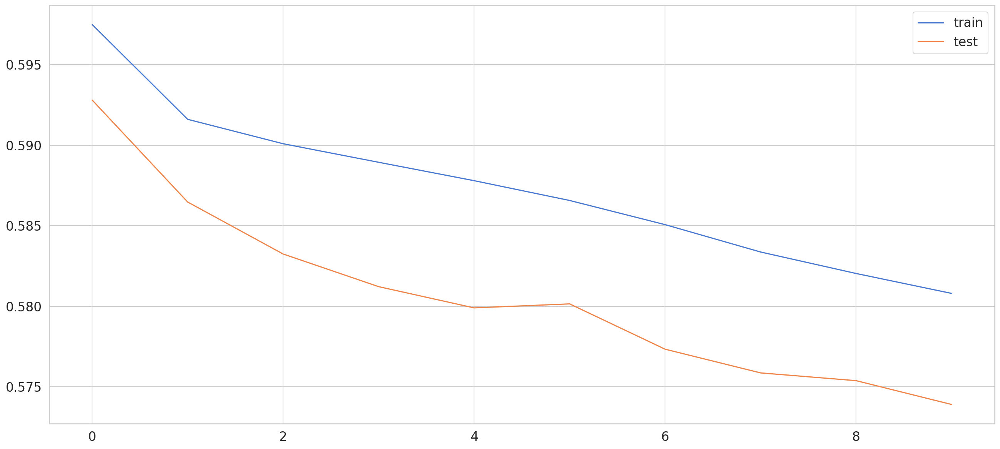

In [ ]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend();

# **Finding Anomalies**
*Still, we need to detect anomalies. Let’s start with calculating the Mean Absolute Error (MAE) on the training data:*

In [ ]:
X_train_pred = model.predict(X_train)

train_mae_loss = np.mean(np.abs(X_train_pred - X_train), axis=1)

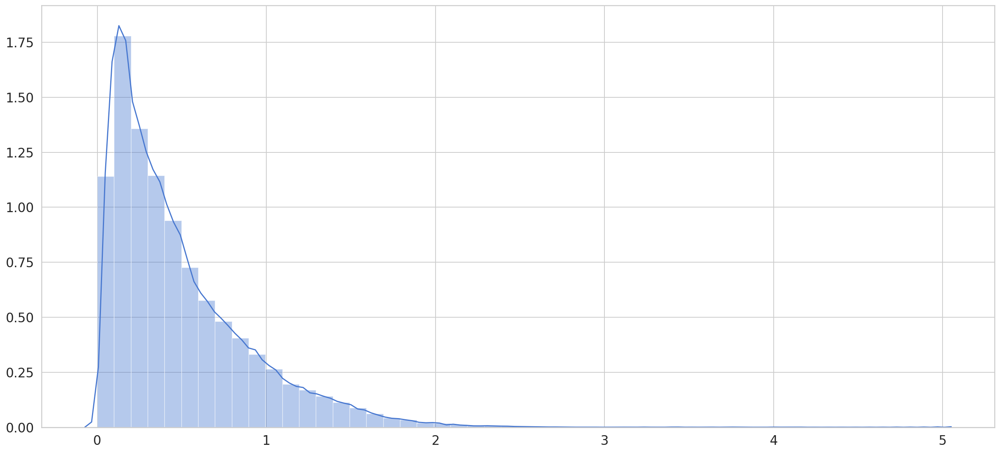

In [ ]:
sns.distplot(train_mae_loss, bins=50, kde=True);

In [ ]:
X_test_pred = model.predict(X_test)

test_mae_loss = np.mean(np.abs(X_test_pred - X_test), axis=1)

We’ll pick a threshold of 0.6, as not much of the loss is larger than that. When the error is larger than that, we’ll declare that example an anomaly:
Let’s calculate the MAE on the test data:
We’ll build a DataFrame containing the loss and the anomalies (values above the threshold):

In [ ]:
THRESHOLD = 0.6

test_score_df = pd.DataFrame(index=test[TIME_STEPS:].index)
test_score_df['loss'] = test_mae_loss
test_score_df['threshold'] = THRESHOLD
test_score_df['anomaly'] = test_score_df.loss > test_score_df.threshold
test_score_df['CRS_ELAPSED_TIME'] = test[TIME_STEPS:].CRS_ELAPSED_TIME

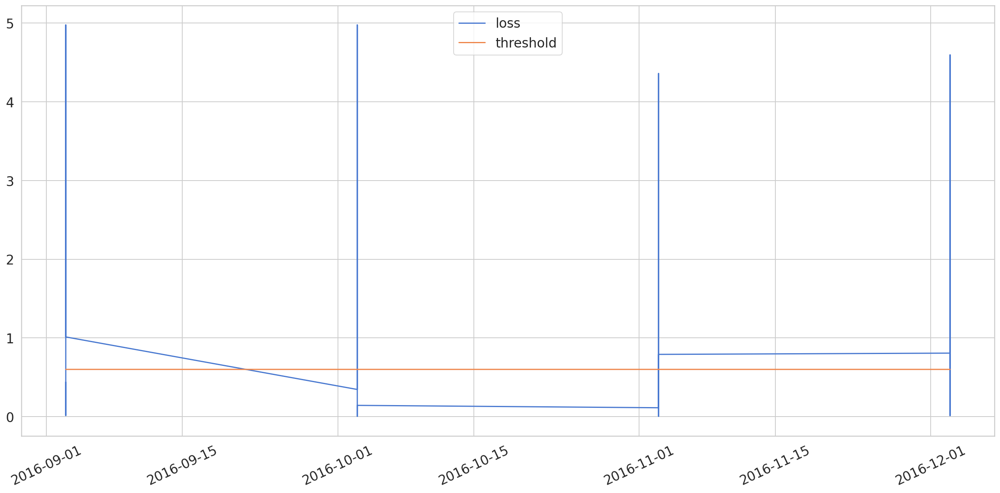

In [ ]:
plt.plot(test_score_df.index, test_score_df.loss, label='loss')
plt.plot(test_score_df.index, test_score_df.threshold, label='threshold')
plt.xticks(rotation=25)
plt.legend();

Looks like we’re thresholding extreme values quite well. Let’s create a DataFrame using only those:
Finally, let’s look at the anomalies found in the testing data:

You should have a thorough look at the chart. The red dots (anomalies) are covering most of the points with abrupt changes to the closing price. You can play around with the threshold and try to get even better results.

In [ ]:
anomalies = test_score_df[test_score_df.anomaly == True]
anomalies.head()

,loss,threshold,anomaly,CRS_ELAPSED_TIME
FL_DATE,,,,
2016-09-03,0.601990,0.6,True,-0.461941
2016-09-03,0.731536,0.6,True,0.950363
2016-09-03,0.866845,0.6,True,0.270365
2016-09-03,0.740131,0.6,True,0.139596
2016-09-03,0.677560,0.6,True,0.819595


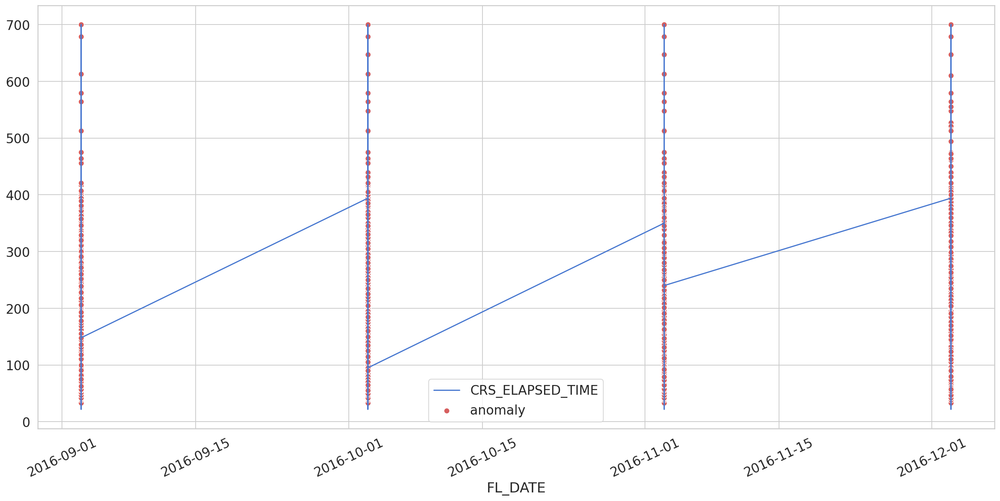

In [ ]:
plt.plot(
  test[TIME_STEPS:].index, 
  scaler.inverse_transform(test[TIME_STEPS:].CRS_ELAPSED_TIME), 
  label='CRS_ELAPSED_TIME'
);

sns.scatterplot(
  anomalies.index,
  scaler.inverse_transform(anomalies.CRS_ELAPSED_TIME),
  color=sns.color_palette()[3],
  s=52,
  label='anomaly'
)
plt.xticks(rotation=25)
plt.legend();

# **Conclusion**:
*You just combined two powerful concepts in Deep Learning - LSTMs and Autoencoders. The result is a model that can find anomalies. You can try to tune the model and/or the threshold to get even better results.*